# PCA

## Task 1: Exploratory Data Analysis (EDA):

In [1]:
#import all necessary packages for doing PCA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.preprocessing import StandardScaler,OrdinalEncoder
from sklearn.impute import SimpleImputer
import warnings
warnings.filterwarnings('ignore')

1.	Load the dataset and perform basic data exploration.

In [2]:
data=pd.read_csv("wine.csv")

In [3]:
data.shape #no.of columns and rows

(178, 14)

In [4]:
data.dtypes

,0
Type,int64
Alcohol,float64
Malic,float64
Ash,float64
Alcalinity,float64
Magnesium,int64
Phenols,float64
Flavanoids,float64
Nonflavanoids,float64
Proanthocyanins,float64


In [5]:
data.info() #information of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [6]:
data.head() #first 5 rows

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [7]:
print(data.describe())   # only for numerical  columns for getting statistical infomation

             Type     Alcohol       Malic         Ash  Alcalinity   Magnesium  \
count  178.000000  178.000000  178.000000  178.000000  178.000000  178.000000   
mean     1.938202   13.000618    2.336348    2.366517   19.494944   99.741573   
std      0.775035    0.811827    1.117146    0.274344    3.339564   14.282484   
min      1.000000   11.030000    0.740000    1.360000   10.600000   70.000000   
25%      1.000000   12.362500    1.602500    2.210000   17.200000   88.000000   
50%      2.000000   13.050000    1.865000    2.360000   19.500000   98.000000   
75%      3.000000   13.677500    3.082500    2.557500   21.500000  107.000000   
max      3.000000   14.830000    5.800000    3.230000   30.000000  162.000000   

          Phenols  Flavanoids  Nonflavanoids  Proanthocyanins       Color  \
count  178.000000  178.000000     178.000000       178.000000  178.000000   
mean     2.295112    2.029270       0.361854         1.590899    5.058090   
std      0.625851    0.998859       0.1

In [8]:
data.isnull().sum()##  checking for missing values

,0
Type,0
Alcohol,0
Malic,0
Ash,0
Alcalinity,0
Magnesium,0
Phenols,0
Flavanoids,0
Nonflavanoids,0
Proanthocyanins,0


In [9]:
data.duplicated().sum() #checking for duplicates

np.int64(0)

In [10]:
data.corr() ##getting correlation all columns

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
Type,1.000000,-0.328222,0.437776,-0.049643,0.517859,-0.209179,-0.719163,-0.847498,0.489109,-0.499130,0.265668,-0.617369,-0.788230,-0.633717
Alcohol,-0.328222,1.000000,0.094397,0.211545,-0.310235,0.270798,0.289101,0.236815,-0.155929,0.136698,0.546364,-0.071747,0.072343,0.643720
Malic,0.437776,0.094397,1.000000,0.164045,0.288500,-0.054575,-0.335167,-0.411007,0.292977,-0.220746,0.248985,-0.561296,-0.368710,-0.192011
Ash,-0.049643,0.211545,0.164045,1.000000,0.443367,0.286587,0.128980,0.115077,0.186230,0.009652,0.258887,-0.074667,0.003911,0.223626
Alcalinity,0.517859,-0.310235,0.288500,0.443367,1.000000,-0.083333,-0.321113,-0.351370,0.361922,-0.197327,0.018732,-0.273955,-0.276769,-0.440597
Magnesium,-0.209179,0.270798,-0.054575,0.286587,-0.083333,1.000000,0.214401,0.195784,-0.256294,0.236441,0.199950,0.055398,0.066004,0.393351
Phenols,-0.719163,0.289101,-0.335167,0.128980,-0.321113,0.214401,1.000000,0.864564,-0.449935,0.612413,-0.055136,0.433681,0.699949,0.498115
Flavanoids,-0.847498,0.236815,-0.411007,0.115077,-0.351370,0.195784,0.864564,1.000000,-0.537900,0.652692,-0.172379,0.543479,0.787194,0.494193
Nonflavanoids,0.489109,-0.155929,0.292977,0.186230,0.361922,-0.256294,-0.449935,-0.537900,1.000000,-0.365845,0.139057,-0.262640,-0.503270,-0.311385
Proanthocyanins,-0.499130,0.136698,-0.220746,0.009652,-0.197327,0.236441,0.612413,0.652692,-0.365845,1.000000,-0.025250,0.295544,0.519067,0.330417


2.	Examine the distribution of features using histograms, box plots, or density plots.

array([[<Axes: title={'center': 'Type'}>,
        <Axes: title={'center': 'Alcohol'}>,
        <Axes: title={'center': 'Malic'}>,
        <Axes: title={'center': 'Ash'}>],
       [<Axes: title={'center': 'Alcalinity'}>,
        <Axes: title={'center': 'Magnesium'}>,
        <Axes: title={'center': 'Phenols'}>,
        <Axes: title={'center': 'Flavanoids'}>],
       [<Axes: title={'center': 'Nonflavanoids'}>,
        <Axes: title={'center': 'Proanthocyanins'}>,
        <Axes: title={'center': 'Color'}>,
        <Axes: title={'center': 'Hue'}>],
       [<Axes: title={'center': 'Dilution'}>,
        <Axes: title={'center': 'Proline'}>, <Axes: >, <Axes: >]],
      dtype=object)

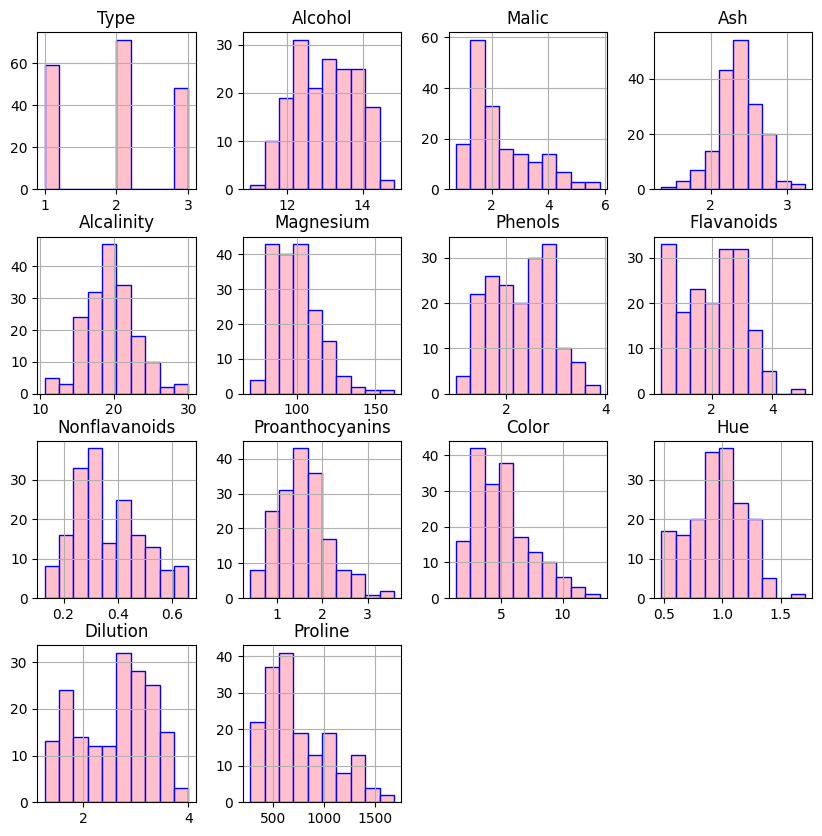

In [11]:
#### Graph Distribution
data.hist(figsize=(10,10),color='pink',edgecolor='blue') ##histogram and their distributions

<Axes: >

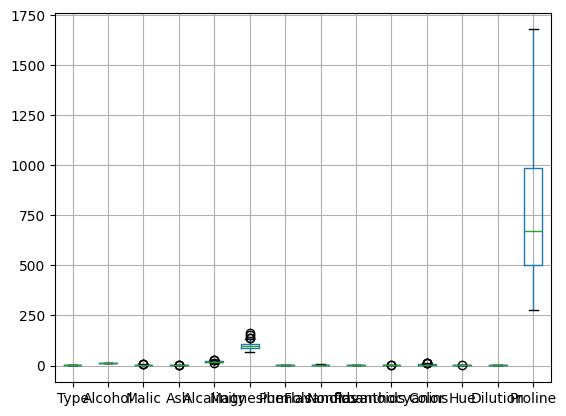

In [12]:
data.boxplot() ##box plot for outlier checking

In [13]:
def outlier_capping(data, col): #removing outliers
    Q1, Q3 = data[col].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
    data[col] = data[col].clip(lower, upper)   # directly cap values using clip()

for col in data.select_dtypes(include=['int', 'float']).columns:
    outlier_capping(data, col)

<Axes: >

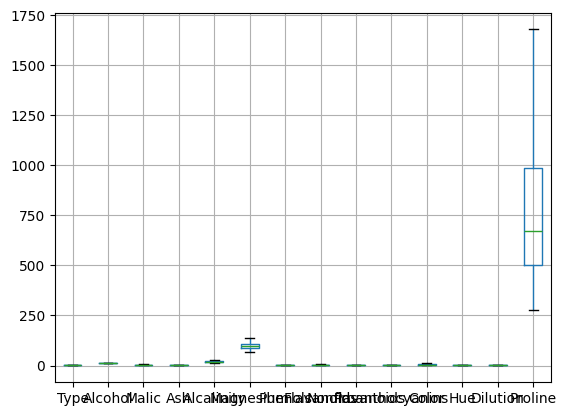

In [14]:
data.boxplot()

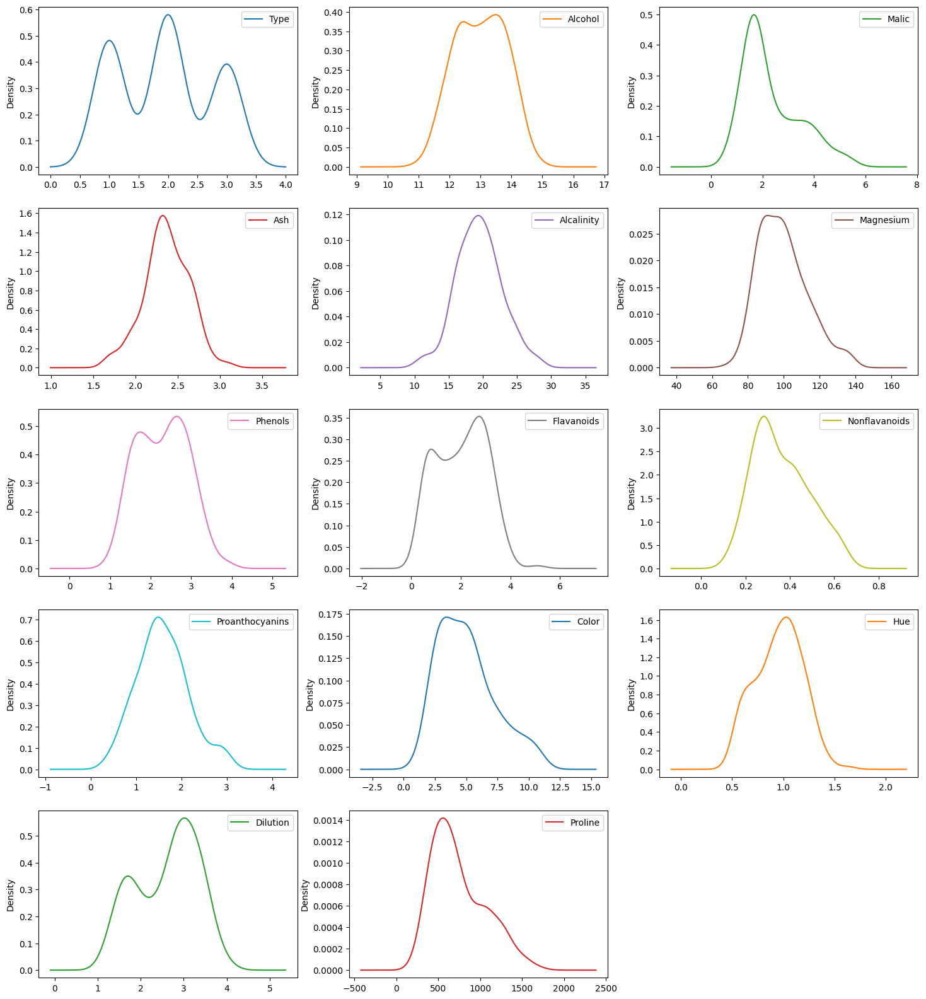

In [15]:
data.plot(kind="density", subplots=True, layout=(5,3), sharex=False, figsize=(18,20))
plt.show() ## density plot for each columns

3.	Investigate correlations between features to understand relationships within the data.

In [16]:
data.corr() ##getting correlations

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
Type,1.000000,-0.328222,0.440422,-0.047680,0.525608,-0.224264,-0.719163,-0.847498,0.489109,-0.512528,0.260260,-0.621549,-0.788230,-0.633717
Alcohol,-0.328222,1.000000,0.094756,0.220174,-0.312191,0.302173,0.289101,0.236815,-0.155929,0.153171,0.549107,-0.067156,0.072343,0.643720
Malic,0.440422,0.094756,1.000000,0.166614,0.295882,-0.039329,-0.339050,-0.414875,0.294203,-0.234575,0.264897,-0.566409,-0.372582,-0.191173
Ash,-0.047680,0.220174,0.166614,1.000000,0.427713,0.322510,0.124436,0.097562,0.183666,0.006080,0.256799,-0.075904,-0.011214,0.229676
Alcalinity,0.525608,-0.312191,0.295882,0.427713,1.000000,-0.098030,-0.333046,-0.363405,0.369276,-0.208794,0.009748,-0.286664,-0.287032,-0.448700
Magnesium,-0.224264,0.302173,-0.039329,0.322510,-0.098030,1.000000,0.227035,0.209431,-0.255674,0.201428,0.240505,0.040007,0.064019,0.411557
Phenols,-0.719163,0.289101,-0.339050,0.124436,-0.333046,0.227035,1.000000,0.864564,-0.449935,0.618771,-0.062101,0.435952,0.699949,0.498115
Flavanoids,-0.847498,0.236815,-0.414875,0.097562,-0.363405,0.209431,0.864564,1.000000,-0.537900,0.665384,-0.169807,0.546718,0.787194,0.494193
Nonflavanoids,0.489109,-0.155929,0.294203,0.183666,0.369276,-0.255674,-0.449935,-0.537900,1.000000,-0.368455,0.131596,-0.266995,-0.503270,-0.311385
Proanthocyanins,-0.512528,0.153171,-0.234575,0.006080,-0.208794,0.201428,0.618771,0.665384,-0.368455,1.000000,-0.032693,0.306289,0.530565,0.340562


<Axes: >

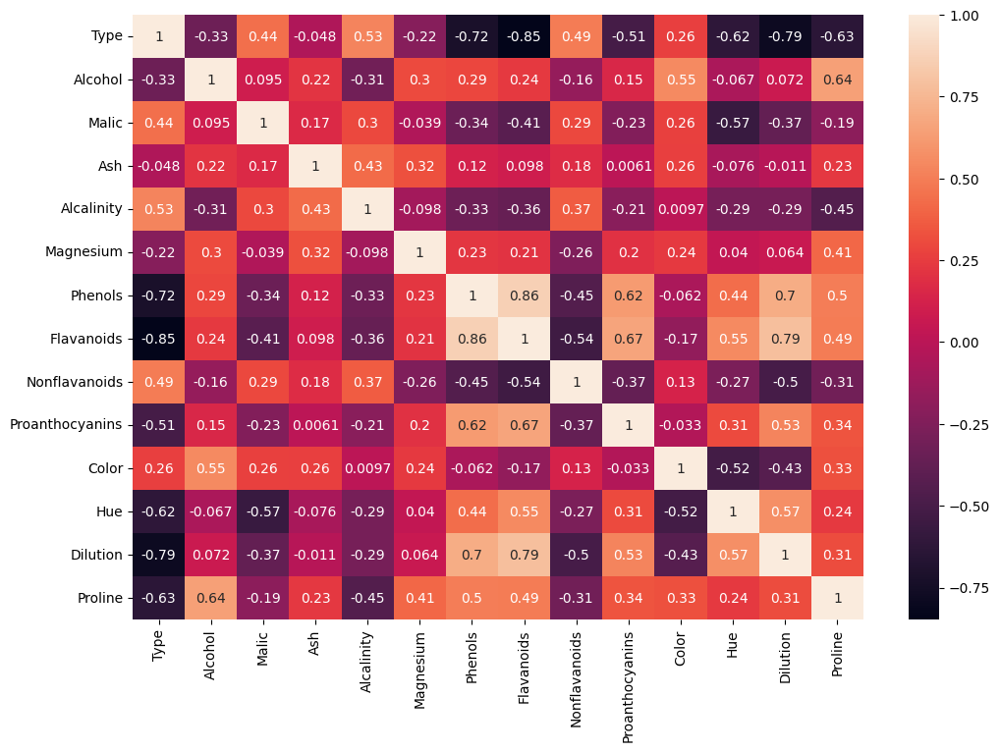

In [17]:
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(),annot=True,) #Seeing correlation matrix using heatmap

## Task 2: Dimensionality Reduction with PCA:

1.	Standardize the features to ensure they have a mean of 0 and a standard deviation of Implement PCA to reduce the dimensionality of the dataset.

In [18]:
std_sca=StandardScaler() ## Calling standardscalar() package using std_sca
data1=pd.DataFrame(std_sca.fit_transform(data),columns=data.columns) #fitting our dataset columns for transforming into standard format
data1.head()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,-1.213944,1.518613,-0.565534,0.240640,-1.182882,2.057111,0.808997,1.034819,-0.659563,1.264740,0.266954,0.366610,1.847920,1.013009
1,-1.213944,0.246290,-0.501728,-0.862176,-2.524956,0.038639,0.568648,0.733629,-0.820719,-0.549904,-0.291923,0.410768,1.113449,0.965242
2,-1.213944,0.196879,0.026948,1.153315,-0.267832,0.113397,0.808997,1.215533,-0.498407,2.199012,0.284696,0.322451,0.788587,1.395148
3,-1.213944,1.691550,-0.346771,0.506837,-0.816862,1.010496,2.491446,1.466525,-0.981875,1.067105,1.225029,-0.428246,1.184071,2.334574
4,-1.213944,0.295700,0.236596,1.913878,0.464208,1.384287,0.808997,0.663351,0.226796,0.420301,-0.318536,0.366610,0.449601,-0.037874


In [19]:
data1.describe() ## getting statistical info by using describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02,178.000000,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02
mean,1.596725e-16,-8.382808e-16,2.395088e-16,-4.478315e-16,-3.592632e-16,-7.983626e-17,0.000000,-3.991813e-16,3.592632e-16,2.395088e-16,-4.989766e-17,-7.983626e-17,3.193450e-16,-1.596725e-16
std,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00,1.002821,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00
min,-1.213944e+00,-2.434235e+00,-1.449701e+00,-2.578195e+00,-2.662213e+00,-2.204108e+00,-2.107246,-1.695971e+00,-1.868234e+00,-2.113014e+00,-1.666938e+00,-2.106273e+00,-1.895054e+00,-1.493188e+00
25%,-1.213944e+00,-7.882448e-01,-6.635217e-01,-5.959788e-01,-6.948555e-01,-8.584597e-01,-0.885468,-8.275393e-01,-7.401412e-01,-6.038048e-01,-8.064445e-01,-7.704749e-01,-9.522483e-01,-7.846378e-01
50%,7.996036e-02,6.099988e-02,-4.242499e-01,-2.555683e-02,6.682950e-03,-1.108774e-01,0.095960,1.061497e-01,-1.760948e-01,-5.581813e-02,-1.544213e-01,3.541993e-02,2.377348e-01,-2.337204e-01
75%,1.373864e+00,8.361286e-01,6.855158e-01,7.254987e-01,6.167164e-01,5.619467e-01,0.808997,8.490851e-01,6.095413e-01,6.538695e-01,5.153441e-01,7.198786e-01,7.885875e-01,7.582494e-01
max,1.373864e+00,2.259772e+00,2.709072e+00,2.707715e+00,2.584074e+00,2.692556e+00,2.539515,3.062832e+00,2.402403e+00,2.540381e+00,2.498027e+00,2.955409e+00,1.960915e+00,2.971473e+00


In [20]:
data.head() ## data before standardization

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [21]:
data1.head()## data after standardization

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,-1.213944,1.518613,-0.565534,0.240640,-1.182882,2.057111,0.808997,1.034819,-0.659563,1.264740,0.266954,0.366610,1.847920,1.013009
1,-1.213944,0.246290,-0.501728,-0.862176,-2.524956,0.038639,0.568648,0.733629,-0.820719,-0.549904,-0.291923,0.410768,1.113449,0.965242
2,-1.213944,0.196879,0.026948,1.153315,-0.267832,0.113397,0.808997,1.215533,-0.498407,2.199012,0.284696,0.322451,0.788587,1.395148
3,-1.213944,1.691550,-0.346771,0.506837,-0.816862,1.010496,2.491446,1.466525,-0.981875,1.067105,1.225029,-0.428246,1.184071,2.334574
4,-1.213944,0.295700,0.236596,1.913878,0.464208,1.384287,0.808997,0.663351,0.226796,0.420301,-0.318536,0.366610,0.449601,-0.037874


In [22]:
### Implement of PCA
from sklearn.decomposition import PCA ##importing PCA from sklearn package

In [23]:
pca=PCA(n_components=10) ##top 10 columns is n_components=10
pca.fit(data1) ## fit our standardized data in pca()

PCA(n_components=10)

In [24]:
explained_variance = pca.explained_variance_ratio_
explained_variance #getting variance for each column

array([0.39807866, 0.18209648, 0.1013214 , 0.06619413, 0.05983257,
       0.04726317, 0.03753501, 0.02554538, 0.02108632, 0.01880492])

In [25]:
New_data=pca.transform(data1) #now, transforming our fitted PCA data

In [26]:
data1.head() ##Before PCA

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,-1.213944,1.518613,-0.565534,0.240640,-1.182882,2.057111,0.808997,1.034819,-0.659563,1.264740,0.266954,0.366610,1.847920,1.013009
1,-1.213944,0.246290,-0.501728,-0.862176,-2.524956,0.038639,0.568648,0.733629,-0.820719,-0.549904,-0.291923,0.410768,1.113449,0.965242
2,-1.213944,0.196879,0.026948,1.153315,-0.267832,0.113397,0.808997,1.215533,-0.498407,2.199012,0.284696,0.322451,0.788587,1.395148
3,-1.213944,1.691550,-0.346771,0.506837,-0.816862,1.010496,2.491446,1.466525,-0.981875,1.067105,1.225029,-0.428246,1.184071,2.334574
4,-1.213944,0.295700,0.236596,1.913878,0.464208,1.384287,0.808997,0.663351,0.226796,0.420301,-0.318536,0.366610,0.449601,-0.037874


In [27]:
New_data.shape ##PCA transformed data with 10 columns

(178, 10)

2.	Determine the optimal number of principal components using techniques like scree plot or cumulative explained variance.

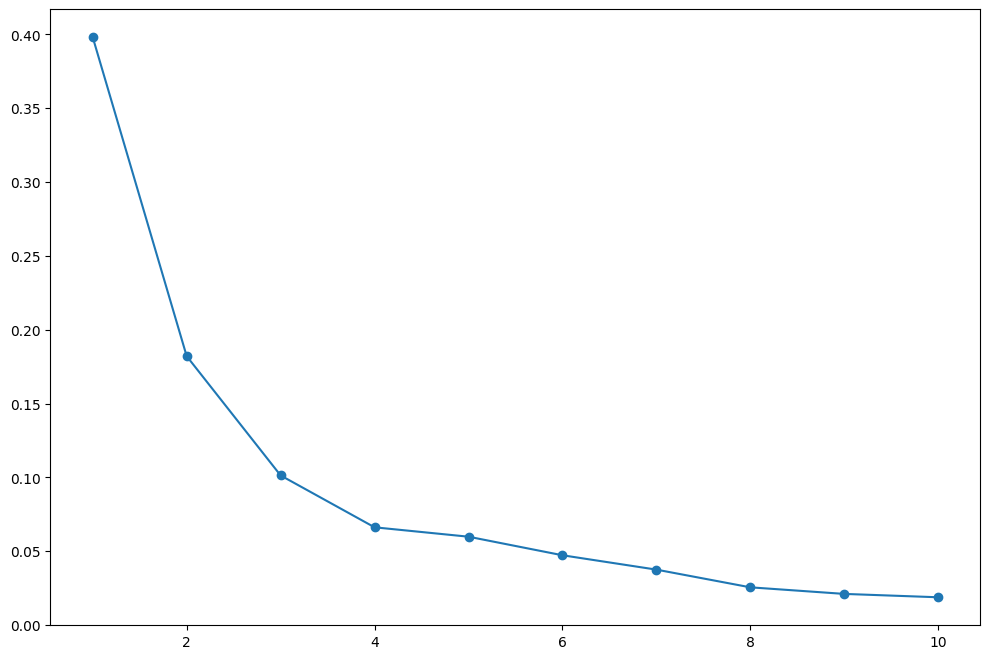

In [28]:
# Scree plot for getting optimal number of principal components
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-')

In [29]:
# Clustering with dataset
New_data.shape

(178, 10)

3.	Transform the original dataset into the principal components.

In [30]:
print("Original data shape:", data.shape)
print("\nTransformed data shape:", New_data.shape) #details of orginal datatset and PCA transformed dataset
print("PCA Transformed Data:\n", New_data)

Original data shape: (178, 14)

Transformed data shape: (178, 10)
PCA Transformed Data:
 [[-3.56196816  1.52896694 -0.13055758 ... -0.01163922 -0.51270506
  -1.06887582]
 [-2.54433006 -0.32999258 -2.04160282 ... -0.98171719  0.32077906
  -0.02054718]
 [-2.80654586  1.04222492  1.01679147 ...  0.41429661  1.21394459
   0.07091695]
 ...
 [ 3.01960071  2.8609113  -0.97571878 ... -0.01960003 -0.03675672
   0.19954907]
 [ 2.73930763  2.39059456 -0.56244889 ... -0.37968128  0.0344885
  -0.51221298]
 [ 3.51359181  2.79305368  1.03399921 ...  0.22459793 -0.72788466
   0.00544449]]


## Task 3: Clustering with Original Data:

1.	Apply a clustering algorithm (e.g., K-means) to the original dataset.

In [31]:
from sklearn.cluster import KMeans #importing packages for k-means clustering
from sklearn.metrics import silhouette_score

In [32]:
#Original data
Kmeans=KMeans(n_clusters=3) ##no of clusters=3
cluster=Kmeans.fit(data) ##fitting our original data into cluster

In [33]:
np.unique(cluster.labels_)  #3 clusters in integer datatype

array([0, 1, 2], dtype=int32)

In [34]:
data['cluster']=cluster.labels_
data ##total 3 cluster(groups) in our original data  total 0-177 rows

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,cluster
0,1,14.23,1.7100,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,0
1,1,13.20,1.7800,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,0
2,1,13.16,2.3600,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,2
3,1,14.37,1.9500,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,2
4,1,13.24,2.5900,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.3025,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,0
174,3,13.40,3.9100,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,0
175,3,13.27,4.2800,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,0
176,3,13.17,2.5900,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,0


In [35]:
data[data['cluster']==0] #0th cluster

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,cluster
0,1,14.23,1.7100,2.43000,15.60,127.0,2.80,3.06,0.28,2.29,5.64,1.040,3.92,1065,0
1,1,13.20,1.7800,2.14000,11.20,100.0,2.65,2.76,0.26,1.28,4.38,1.050,3.40,1050,0
4,1,13.24,2.5900,2.87000,21.00,118.0,2.80,2.69,0.39,1.82,4.32,1.040,2.93,735,0
8,1,14.83,1.6400,2.17000,14.00,97.0,2.80,2.98,0.29,1.98,5.20,1.080,2.85,1045,0
9,1,13.86,1.3500,2.27000,16.00,98.0,2.98,3.15,0.22,1.85,7.22,1.010,3.55,1045,0
19,1,13.64,3.1000,2.56000,15.20,116.0,2.70,3.03,0.17,1.66,5.10,0.960,3.36,845,0
20,1,14.06,1.6300,2.28000,16.00,126.0,3.00,3.17,0.24,2.10,5.65,1.090,3.71,780,0
21,1,12.93,3.8000,2.65000,18.60,102.0,2.41,2.41,0.25,1.98,4.50,1.030,3.52,770,0
22,1,13.71,1.8600,2.36000,16.60,101.0,2.61,2.88,0.27,1.69,3.80,1.110,4.00,1035,0
23,1,12.85,1.6000,2.52000,17.80,95.0,2.48,2.37,0.26,1.46,3.93,1.090,3.63,1015,0


In [36]:
data[data['cluster']==1] #1st cluster

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,cluster
43,1,13.24,3.98,2.29000,17.50,103.0,2.64,2.63,0.32,1.66,4.360000,0.82,3.00,680,1
59,2,12.37,0.94,1.68875,10.75,88.0,1.98,0.57,0.28,0.42,1.950000,1.05,1.82,520,1
60,2,12.33,1.10,2.28000,16.00,101.0,2.05,1.09,0.63,0.41,3.270000,1.25,1.67,680,1
61,2,12.64,1.36,2.02000,16.80,100.0,2.02,1.41,0.53,0.62,5.750000,0.98,1.59,450,1
62,2,13.67,1.25,1.92000,18.00,94.0,2.10,1.79,0.32,0.73,3.800000,1.23,2.46,630,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169,3,13.40,4.60,2.86000,25.00,112.0,1.98,0.96,0.27,1.11,8.500000,0.67,1.92,630,1
170,3,12.20,3.03,2.32000,19.00,96.0,1.25,0.49,0.40,0.73,5.500000,0.66,1.83,510,1
171,3,12.77,2.39,2.28000,19.50,86.0,1.39,0.51,0.48,0.64,9.899999,0.57,1.63,470,1
172,3,14.16,2.51,2.48000,20.00,91.0,1.68,0.70,0.44,1.24,9.700000,0.62,1.71,660,1


In [37]:
data[data['cluster']==2] #2nd cluster

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,cluster
2,1,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,2
3,1,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,2
5,1,14.20,1.76,2.45,15.2,112.0,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450,2
6,1,14.39,1.87,2.45,14.6,96.0,2.50,2.52,0.30,1.98,5.25,1.02,3.58,1290,2
7,1,14.06,2.15,2.61,17.6,121.0,2.60,2.51,0.31,1.25,5.05,1.06,3.58,1295,2
10,1,14.10,2.16,2.30,18.0,105.0,2.95,3.32,0.22,2.38,5.75,1.25,3.17,1510,2
11,1,14.12,1.48,2.32,16.8,95.0,2.20,2.43,0.26,1.57,5.00,1.17,2.82,1280,2
12,1,13.75,1.73,2.41,16.0,89.0,2.60,2.76,0.29,1.81,5.60,1.15,2.90,1320,2
13,1,14.75,1.73,2.39,11.4,91.0,3.10,3.69,0.43,2.81,5.40,1.25,2.73,1150,2
14,1,14.38,1.87,2.38,12.0,102.0,3.30,3.64,0.29,2.96,7.50,1.20,3.00,1547,2


In [38]:
inertia=Kmeans.inertia_ ##inertia of the data
inertia

2621697.1660361737

In [39]:
silhouette_score(data,cluster.labels_)# Accuracy

np.float64(0.5483022927017229)

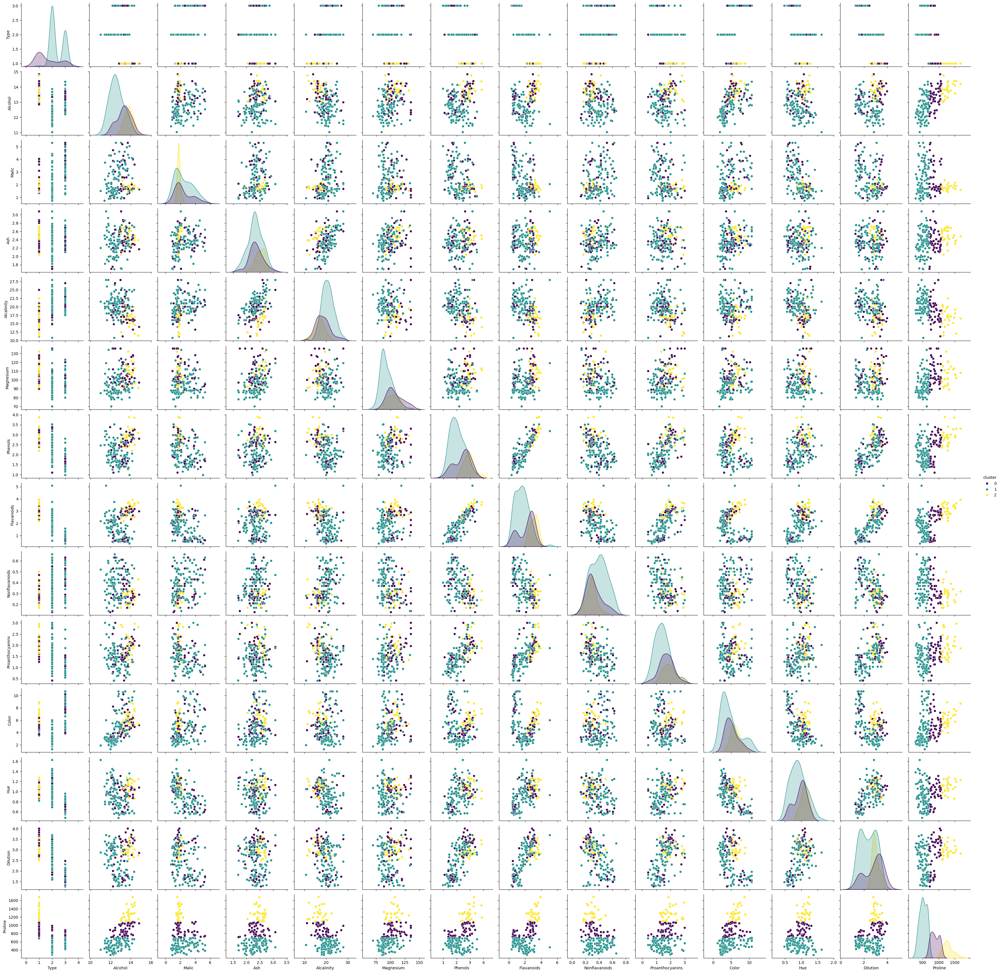

In [40]:
sns.pairplot(data, hue="cluster", diag_kind="kde", palette="viridis") #we using pairplot because scatter plot large features is hard to render

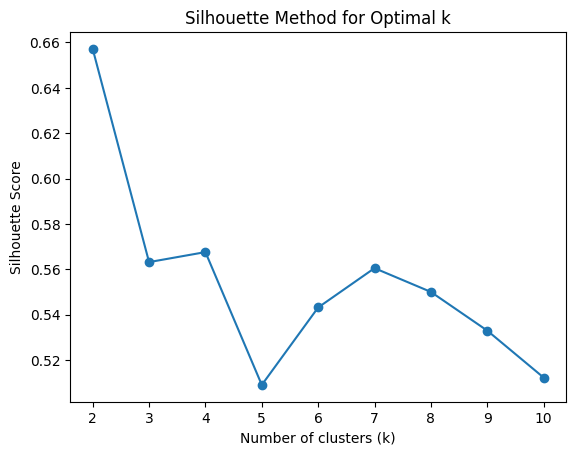

In [41]:
scores = [] ## An empty list is created to store the silhouette scores for each value of k (number of clusters).
for k in range(2, 11): #This loop tests values of k = 2 to 10 (since 11 is excluded).
    kmeans = KMeans(n_clusters=k, random_state=42).fit(data) ##or each value of k, n_clusters=k → number of clusters to form,random_state=42 → ensures reproducibility (same results every run)..fit(data) → applies KMeans on the dataset data and assigns cluster labels.
    scores.append(silhouette_score(data, kmeans.labels_)) #we calculate the silhouette score

plt.plot(range(2, 11), scores, marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Method for Optimal k")
plt.show() #plotting the score

## Task 4: Clustering with PCA Data:

In [42]:
Kmeans=KMeans(n_clusters=3)
cluster=Kmeans.fit(New_data) ##K-means clustering for PCA transformed dataset

In [43]:
np.unique(cluster.labels_)

array([0, 1, 2], dtype=int32)

In [44]:
pca_df = pd.DataFrame(New_data, columns=[f'PC{i+1}' for i in range(New_data.shape[1])]) ##changing array to dataframe

# Add cluster labels
pca_df['cluster'] = cluster.labels_

print(pca_df.head())

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -3.561968  1.528967 -0.130558 -0.102725  0.749767  0.241582  0.687821   
1 -2.544330 -0.329993 -2.041603 -0.448040 -0.193861  0.959958 -0.007630   
2 -2.806546  1.042225  1.016791  0.740693 -0.410847 -0.481234  0.455990   
3 -3.944287  2.793264 -0.154956  0.634237 -0.235032 -0.266787 -0.403404   
4 -1.415866  0.953430  2.117093 -0.479292  0.254285  0.575020  0.492906   

        PC8       PC9      PC10  cluster  
0 -0.011639 -0.512705 -1.068876        0  
1 -0.981717  0.320779 -0.020547        0  
2  0.414297  1.213945  0.070917        0  
3 -0.681048 -0.043371 -0.118619        0  
4 -0.392037 -0.216243 -0.128434        0  


In [45]:
pca_df['cluster']=cluster.labels_
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,cluster
0,-3.561968,1.528967,-0.130558,-0.102725,0.749767,0.241582,0.687821,-0.011639,-0.512705,-1.068876,0
1,-2.544330,-0.329993,-2.041603,-0.448040,-0.193861,0.959958,-0.007630,-0.981717,0.320779,-0.020547,0
2,-2.806546,1.042225,1.016791,0.740693,-0.410847,-0.481234,0.455990,0.414297,1.213945,0.070917,0
3,-3.944287,2.793264,-0.154956,0.634237,-0.235032,-0.266787,-0.403404,-0.681048,-0.043371,-0.118619,0
4,-1.415866,0.953430,2.117093,-0.479292,0.254285,0.575020,0.492906,-0.392037,-0.216243,-0.128434,0
...,...,...,...,...,...,...,...,...,...,...,...
173,3.575821,2.165115,-0.378914,0.731787,-0.921869,1.039551,0.611655,0.171300,-0.100215,0.329309,1
174,2.951568,1.793183,0.210665,0.422008,0.142318,0.013560,0.131525,0.575910,0.012272,0.246623,1
175,3.019601,2.860911,-0.975719,0.509405,1.123057,-0.094408,0.892320,-0.019600,-0.036757,0.199549,1
176,2.739308,2.390595,-0.562449,-0.479537,0.878447,-1.114849,0.896294,-0.379681,0.034488,-0.512213,1


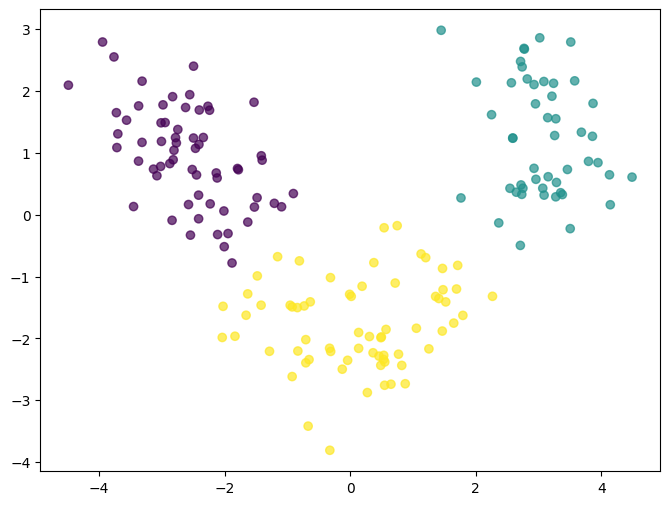

In [46]:
plt.figure(figsize=(8,6))
plt.scatter(pca_df['PC1'], pca_df['PC2'],
            c=pca_df['cluster'], cmap='viridis', alpha=0.7) ###for 1st and 2nd PCA we using scatter plot

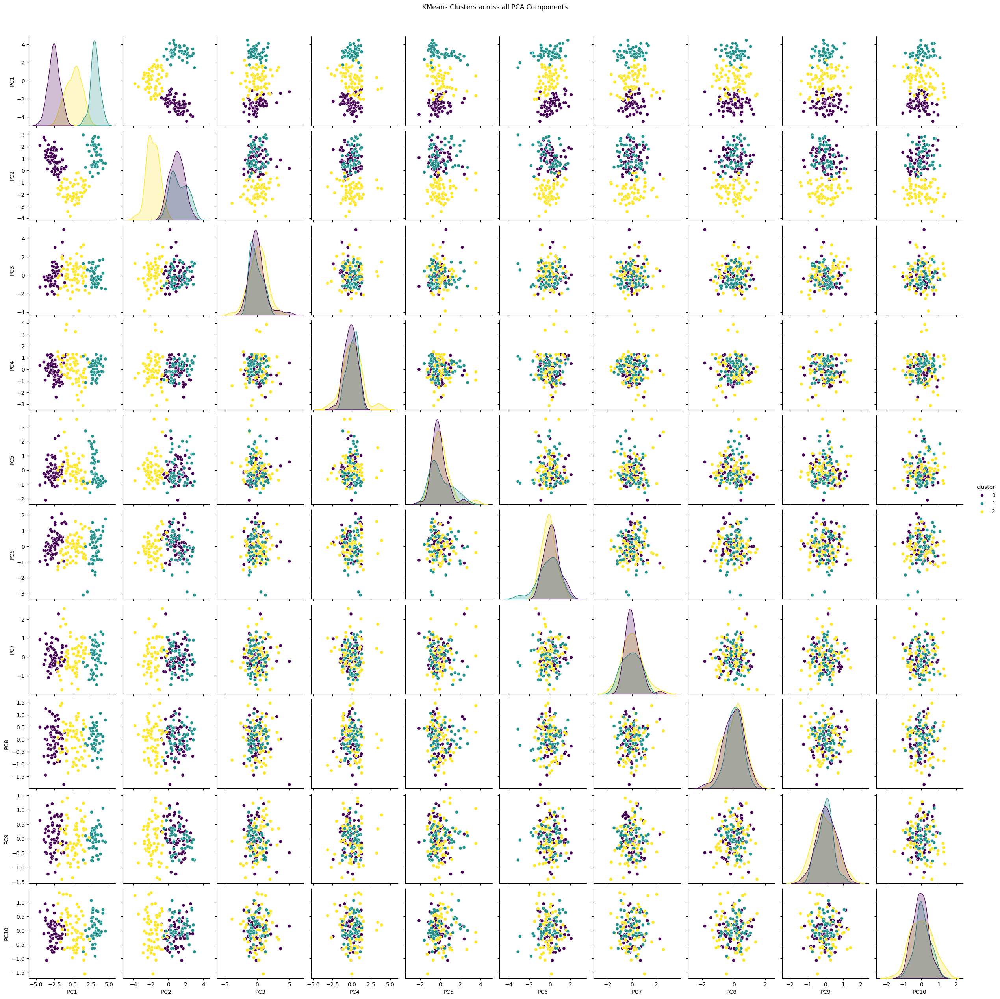

In [47]:
import seaborn as sns ###for till PCA 10 data we using pairplot for visualization

sns.pairplot(pca_df, vars=pca_df.columns[:-1], hue="cluster", palette="viridis", diag_kind="kde")
plt.suptitle("KMeans Clusters across all PCA Components", y=1.02)
plt.show()


In [48]:
import itertools

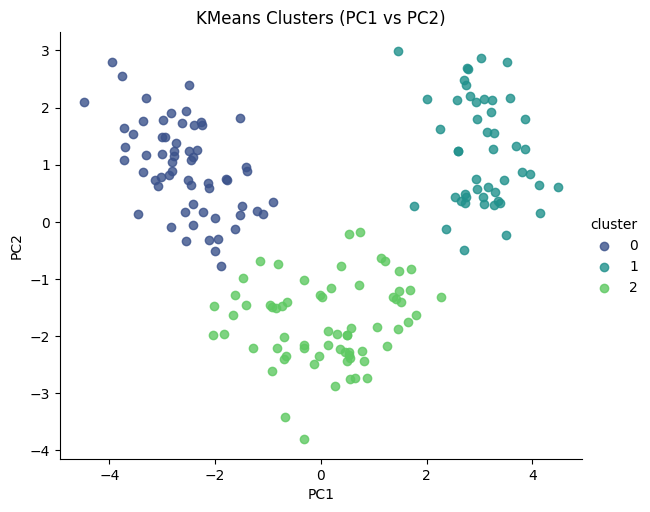

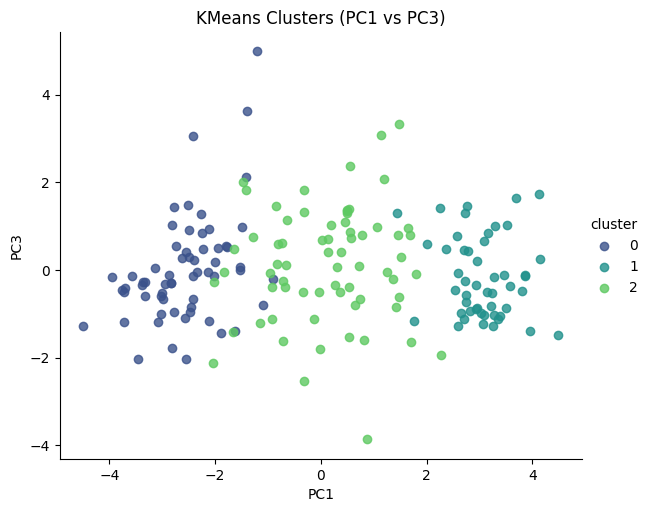

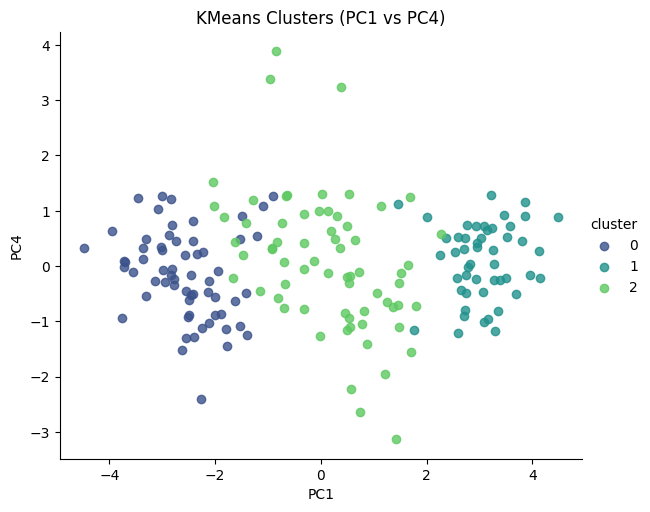

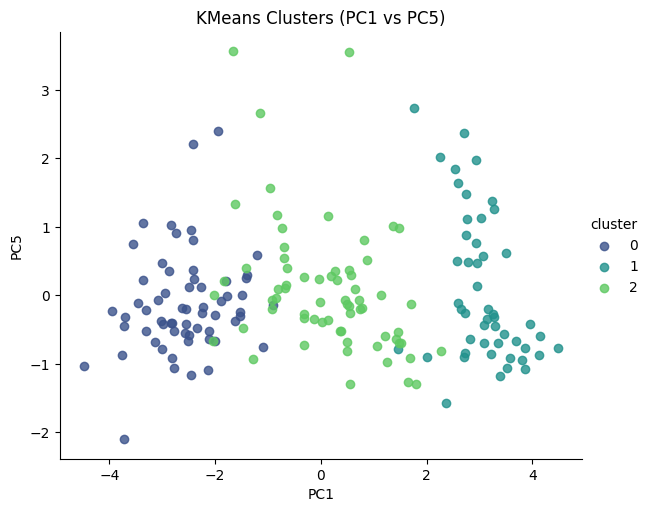

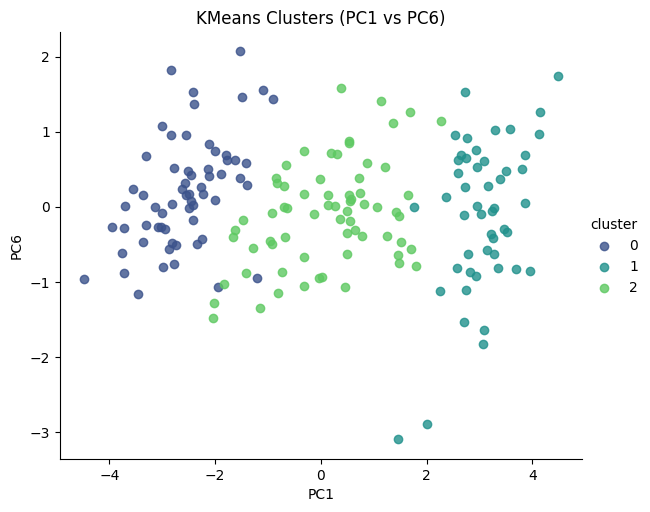

...

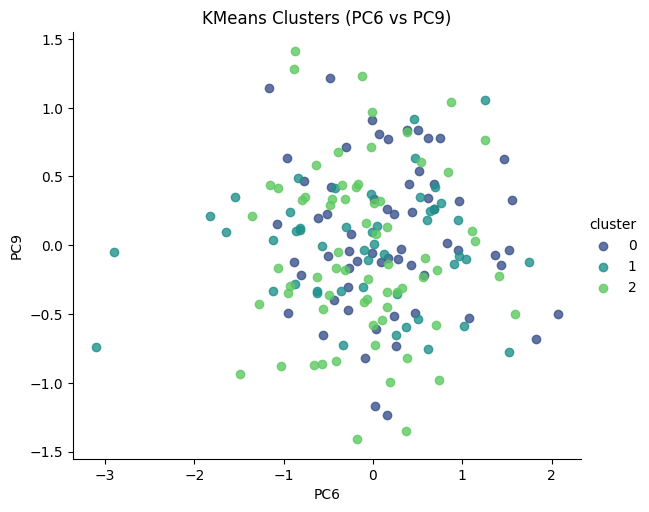

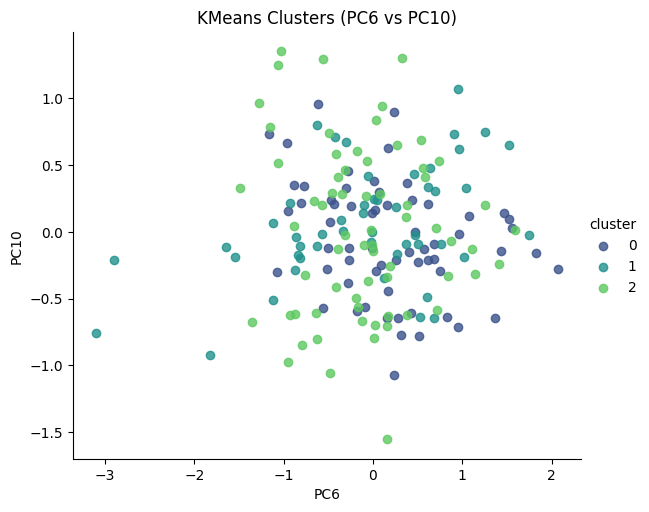

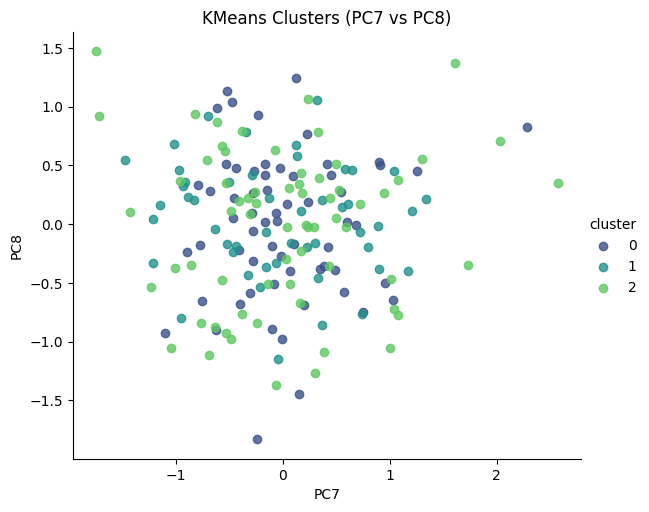

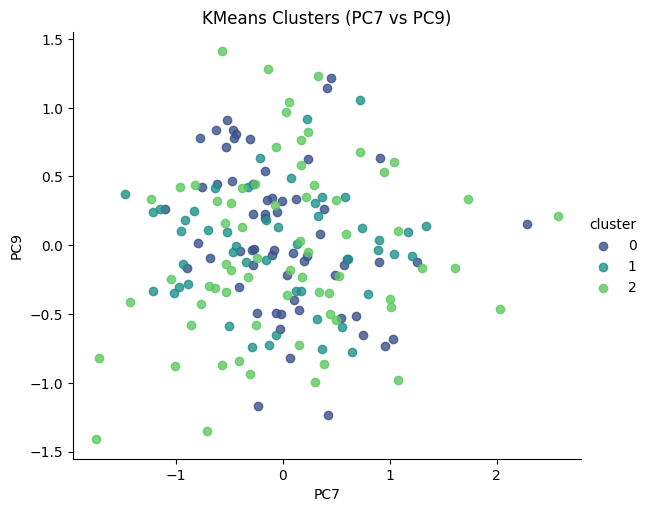

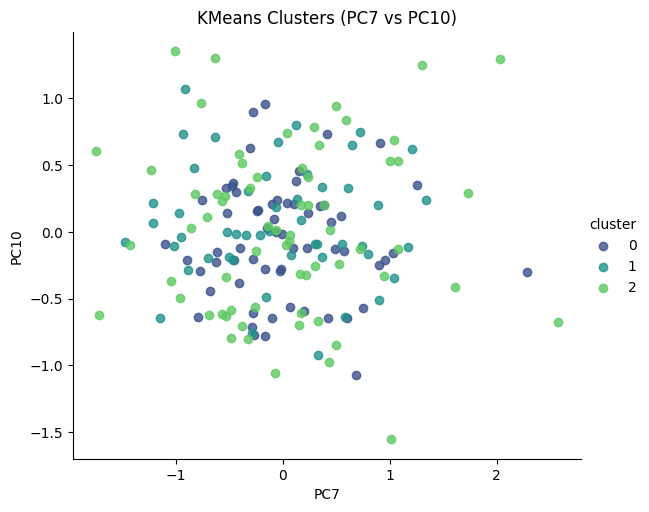

KeyboardInterrupt: 

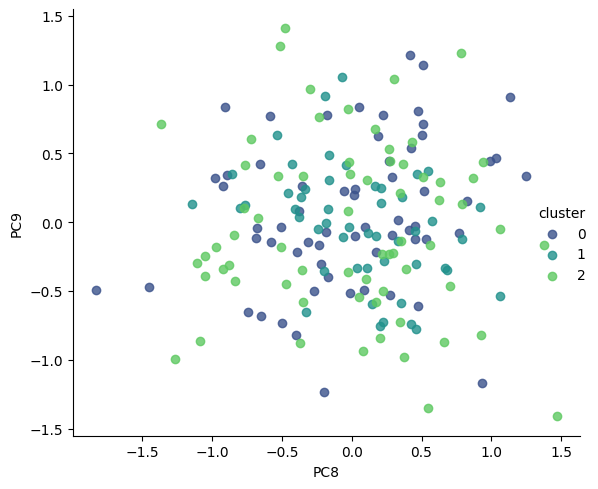

In [50]:
# Select only the columns that represent PCA components (e.g., PC1, PC2, PC3...)
pc_cols = [col for col in pca_df.columns if col.startswith("PC")]

# Loop through all possible unique pairs of PCA components
# Example: if pc_cols = ["PC1","PC2","PC3"], combinations will be (PC1,PC2), (PC1,PC3), (PC2,PC3)
for x_col, y_col in itertools.combinations(pc_cols, 2):

    # Create a scatterplot using Seaborn's lmplot for each PCA component pair
    sns.lmplot(
        x=x_col, y=y_col,        # Plot these two PCA components on X and Y axis
        data=pca_df,             # Use the PCA-transformed DataFrame
        hue="cluster",           # Color the points based on the cluster label from KMeans
        fit_reg=False,           # Disable regression line (only scatter points)
        palette="viridis",       # Use Viridis color map for clusters
        height=5, aspect=1.2     # Control plot size and aspect ratio
    )

    # Add a meaningful title to indicate which PCA components are being compared
    plt.title(f"KMeans Clusters ({x_col} vs {y_col})")

    # Display the plot for this pair of PCA components
    plt.show()


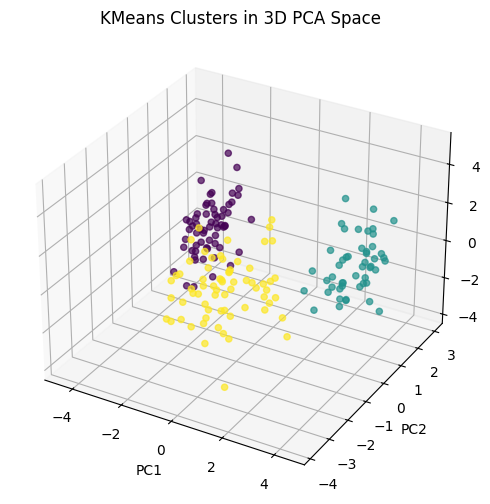

In [51]:
# Import 3D plotting toolkit from Matplotlib
from mpl_toolkits.mplot3d import Axes3D

# Create a figure with a specific size
fig = plt.figure(figsize=(8,6))

# Add a 3D subplot (111 means 1 row, 1 column, 1 plot) with 3D projection
ax = fig.add_subplot(111, projection='3d')

# Create a 3D scatter plot using the first three principal components
ax.scatter(
    pca_df['PC1'], pca_df['PC2'], pca_df['PC3'],  # X, Y, Z coordinates
    c=pca_df['cluster'],      # Color points by cluster label from KMeans
    cmap='viridis',           # Use the 'viridis' color map for clusters
    alpha=0.7                 # Slight transparency for better visualization
)

# Label the axes
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

# Add a title to the plot
plt.title("KMeans Clusters in 3D PCA Space")

# Show the 3D plot
plt.show()


In [52]:
silhouette_score(New_data,cluster.labels_)# Accuracy

np.float64(0.3234461099022564)

In [53]:
# Print the amount of variance explained by each principal component
# This tells us how much information (variance) from the original dataset
# is captured by each PCA component individually.
print("Explained Variance Ratio:", pca.explained_variance_ratio_)

# Print the cumulative variance explained by PCA components
# This shows how much total variance is explained when we keep adding components.
# Useful for deciding how many components to retain (e.g., keep enough to explain 90–95% variance).
print("Cumulative Variance Explained:", pca.explained_variance_ratio_.cumsum())

Explained Variance Ratio: [0.39807866 0.18209648 0.1013214  0.06619413 0.05983257 0.04726317
 0.03753501 0.02554538 0.02108632 0.01880492]
Cumulative Variance Explained: [0.39807866 0.58017514 0.68149655 0.74769068 0.80752325 0.85478642
 0.89232143 0.9178668  0.93895312 0.95775804]


Task 5: Comparison and Analysis:


1.	Compare the clustering results obtained from the original dataset and PCA-transformed data.


2.	Discuss any similarities or differences observed in the clustering results.


3.	Reflect on the impact of dimensionality reduction on clustering performance.


4.	Analyze the trade-offs between using PCA and clustering directly on the original dataset.


In [54]:
print("Original Shape:", data1.shape)   # scaled dataset
print("PCA Shape:", New_data.shape)    # PCA transformed

Original Shape: (178, 14)
PCA Shape: (178, 10)


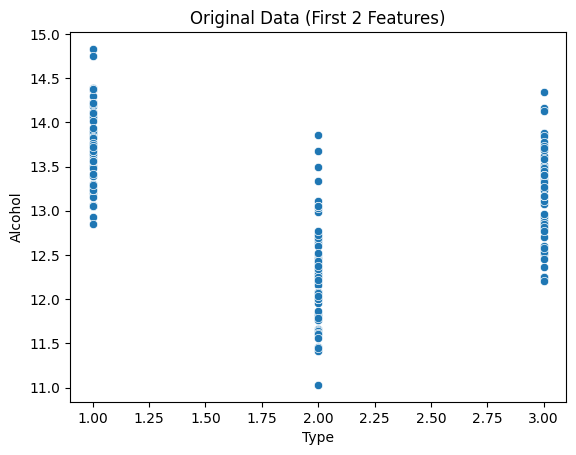

In [55]:
sns.scatterplot(x=data.iloc[:,0], y=data.iloc[:,1])
plt.title("Original Data (First 2 Features)") #using scatter plot we are seeing distribution of original data
plt.show()

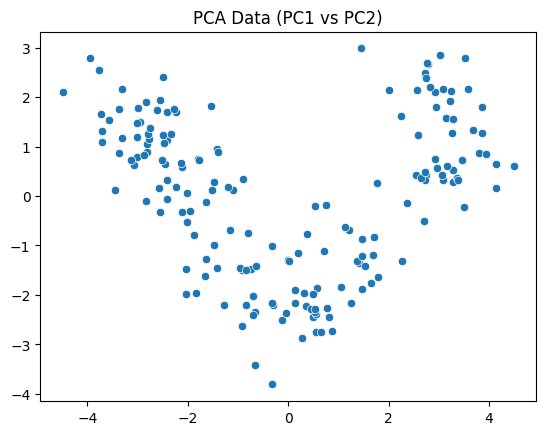

In [56]:
sns.scatterplot(x=New_data[:,0], y=New_data[:,1])
plt.title("PCA Data (PC1 vs PC2)")
plt.show() #PCA data distribution

In [57]:
'''
 1. Compare clustering results (Original vs PCA-transformed data)
 - Clustering on the original dataset uses all features (including correlated/noisy ones).
 - Clustering on PCA-transformed data uses fewer, uncorrelated components that capture most variance.
 - PCA generally improves clustering quality by removing redundancy and noise.

2. Similarities / Differences
 - Similarities: The overall grouping of points may remain similar if natural clusters exist.
 - Differences: Cluster boundaries may shift; silhouette score or inertia may improve with PCA.
   PCA often provides better visual separation in 2D/3D plots.

 3. Impact of dimensionality reduction on clustering
 - Positive impact: Better-defined clusters, faster computation, clearer visualization.
 - Negative impact: Some information loss if too few PCs are kept, which may distort clusters.

 4. Trade-offs (PCA vs Original Data)
 - PCA + Clustering:
     Pros → Removes noise, faster, visual clarity, improved metrics.
     Cons → Loss of some variance, clusters harder to interpret in original feature space.
 - Original Data Clustering:
     Pros → Preserves all information, clusters interpretable in raw features.
     Cons → Noisy, redundant, harder visualization in high dimensions. '''


'\n 1. Compare clustering results (Original vs PCA-transformed data)\n - Clustering on the original dataset uses all features (including correlated/noisy ones).\n - Clustering on PCA-transformed data uses fewer, uncorrelated components that capture most variance.\n - PCA generally improves clustering quality by removing redundancy and noise.\n\n2. Similarities / Differences\n - Similarities: The overall grouping of points may remain similar if natural clusters exist.\n - Differences: Cluster boundaries may shift; silhouette score or inertia may improve with PCA.\n   PCA often provides better visual separation in 2D/3D plots.\n\n 3. Impact of dimensionality reduction on clustering\n - Positive impact: Better-defined clusters, faster computation, clearer visualization.\n - Negative impact: Some information loss if too few PCs are kept, which may distort clusters.\n\n 4. Trade-offs (PCA vs Original Data)\n - PCA + Clustering:\n     Pros → Removes noise, faster, visual clarity, improved me

Task 6: Conclusion and Insights

1.	Summarize the key findings and insights from the assignment.


2.	Discuss the practical implications of using PCA and clustering in data analysis.


3.	Provide recommendations for when to use each technique based on the analysis conducted.

In [58]:
''''

# 1. Key Findings:
# - PCA helps simplify high-dimensional data while retaining most variance.
# - Clustering after PCA often yields more stable and distinct clusters.
# - Raw data clustering may suffer from noise and redundancy.

# 2. Practical Implications:
# - PCA is useful in high-dimensional problems (e.g., images, genetics, NLP).
# - Helps visualize clusters in 2D/3D space.
# - Useful in real-world applications: customer segmentation, anomaly detection, etc.

# 3. Recommendations:
# - Use Original Data + Clustering when:
#     → The dataset has few features.
#     → Interpretability of original variables is critical.
# - Use PCA + Clustering when:
#     → The dataset is high-dimensional with correlated features.
#     → The goal is visualization, noise reduction, or faster computation.'''

"'\n\n# 1. Key Findings:\n# - PCA helps simplify high-dimensional data while retaining most variance.\n# - Clustering after PCA often yields more stable and distinct clusters.\n# - Raw data clustering may suffer from noise and redundancy.\n\n# 2. Practical Implications:\n# - PCA is useful in high-dimensional problems (e.g., images, genetics, NLP).\n# - Helps visualize clusters in 2D/3D space.\n# - Useful in real-world applications: customer segmentation, anomaly detection, etc.\n\n# 3. Recommendations:\n# - Use Original Data + Clustering when:\n#     → The dataset has few features.\n#     → Interpretability of original variables is critical.\n# - Use PCA + Clustering when:\n#     → The dataset is high-dimensional with correlated features.\n#     → The goal is visualization, noise reduction, or faster computation."